# **Identifying Nutrient Deficiencies in Satellite Farmland Imagery**
## 01: EDA

To the extent that we can, in this notebook I'll be attempting to explore the image data and its metadata to help understand its boundaries and how best to work with it.

In [1]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
np.random.seed(42)

In [2]:
#image reviewing methods inspired by Renu Khandelwhal: 
#https://towardsdatascience.com/loading-custom-image-dataset-for-deep-learning-models-part-1-d64fa7aaeca6

import os
import matplotlib.image as mpimg
%matplotlib inline

In [18]:
folder=r'..\data\features'
def plot_random_5(seed):
    np.random.seed(seed)
    fig, axs = plt.subplots(3,5,figsize=(20,12))
    plt.suptitle('random 5 nutrient deficiency crop photos', size=40)
    for i in range(5):
        #get image
        file = np.random.choice(os.listdir(folder))
        image_path = os.path.join(r'..\data\features', file)
        nir_path = os.path.join(r'..\data\nir_features',file)
        #get label:
        file = file.replace('.jpg','.png')
        label_path = os.path.join(r'..\data\labels',file)
        axs[0,i].imshow(mpimg.imread(image_path))
        axs[0,i].title.set_text(f"RGB {i+1}")
        axs[0,i].xaxis.set_visible(False)
        axs[0,i].yaxis.set_visible(False)
        axs[1,i].imshow(mpimg.imread(nir_path),cmap='gray')
        axs[1,i].title.set_text(f"NIR {i+1}")
        axs[1,i].xaxis.set_visible(False)
        axs[1,i].yaxis.set_visible(False)             
        axs[2,i].imshow(mpimg.imread(label_path), cmap='gray')
        axs[2,i].title.set_text(f"Nutrient Deficiency\nLabel {i+1}")
        axs[2,i].xaxis.set_visible(False)
        axs[2,i].yaxis.set_visible(False);

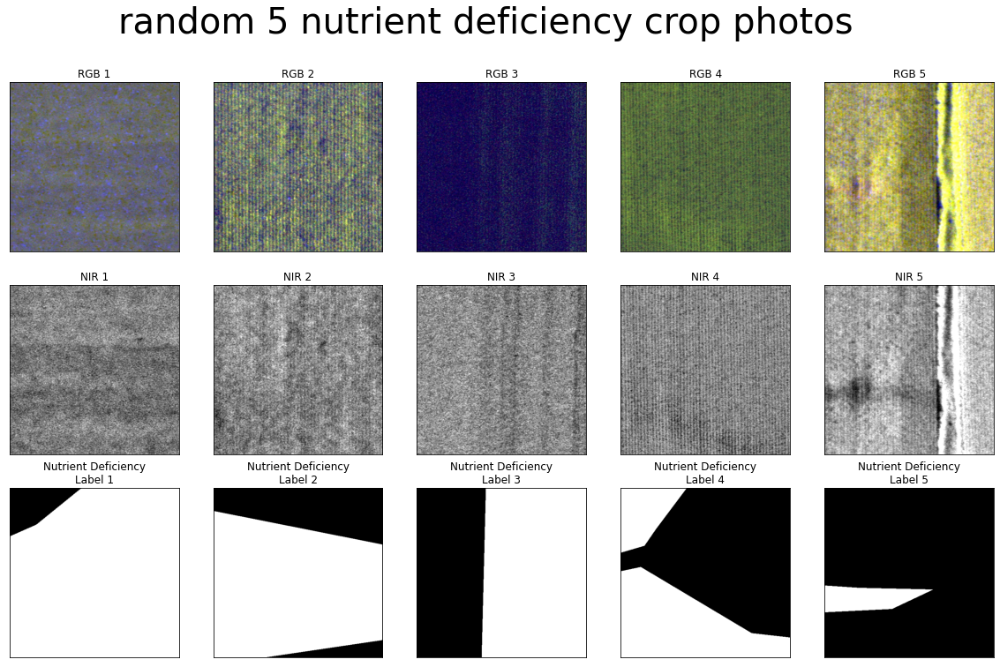

In [19]:
plot_random_5(26)
plt.savefig('../images/EDA_plot_review.png')

In [15]:
#first, take in the metadata:
df = pd.read_csv('../data/image_metadata.csv') 

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
nutrient_deficiency,14712.0,1.175979,0.453642,1.0,1.00,1.0,1.00,10.0
image_area,14712.0,248299.332993,33626.842322,3936.0,262144.00,262144.0,262144.00,262144.0
nutrient_deficiency_area,14712.0,86597.671153,65185.881472,1.0,31921.75,72914.0,130816.25,249003.0
size1,14712.0,512.000000,0.000000,512.0,512.00,512.0,512.00,512.0
size2,14712.0,512.000000,0.000000,512.0,512.00,512.0,512.00,512.0


We can drop the `size1` and `size2` fields since every photo has the same dimensions in our dataset.

In [7]:
df.drop(columns=['size1','size2'],inplace=True)

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
nutrient_deficiency,14712.0,1.175979,0.453642,1.0,1.00,1.0,1.00,10.0
image_area,14712.0,248299.332993,33626.842322,3936.0,262144.00,262144.0,262144.00,262144.0
nutrient_deficiency_area,14712.0,86597.671153,65185.881472,1.0,31921.75,72914.0,130816.25,249003.0


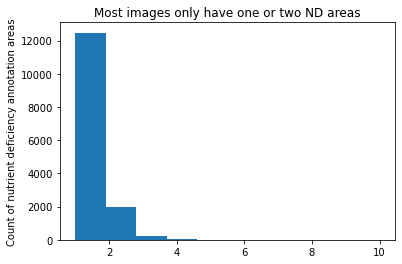

In [26]:
plt.hist(df['nutrient_deficiency'])
plt.title('Most images only have one or two ND areas')
plt.ylabel('Count of nutrient deficiency annotation areas')
plt.savefig('../images/EDA_count_ND_hist.png');

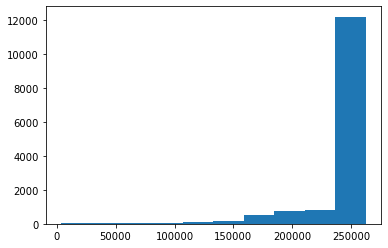

In [9]:
plt.hist(df['image_area'])
plt.title('Histogram of image_area')
;

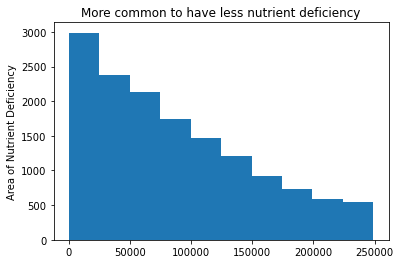

In [27]:
plt.hist(df['nutrient_deficiency_area'])
plt.title('More common to have less nutrient deficiency')
plt.ylabel('Area of Nutrient Deficiency')
plt.savefig('../images/EDA_area_hist.png');

---

## Image PCA and Clustering

Since it appears there are a mix of different lihgting conditions and depictions in our filtered dataset, I'll try to group the images into clusters of like images. To do this, I'll use K-Means clustering and Principal Component Analysis.

**Methods below inspired by Gabe Flomo's [How to cluster images based on visual similarity](https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34).**

In [28]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input, VGG16
from tensorflow.keras.models import Model

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import pickle

In [29]:
folder=r'..\data\features'

In [30]:
images = [x+'.jpg' for x in df['image_name']]

In [14]:
# load the model first and pass as an argument

##disabling because of high processing burden, uncomment to rerun image feature extraction in vgg16:
"""
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features
"""

In [15]:
###disabling because of high processing burden, uncomment to rerun image feature extraction in vgg16:
"""
data = {}
folder='../data/features/'

# lop through each image in the dataset
for image in images:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(folder+image,model)
        data[image] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        pass
          
# get a list of the filenames
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))

# reshape so that there are samples of 4096 vectors
feat = feat.reshape(-1,4096)
#save it to disk:
np.savetxt('../data/image_features.csv',feat,delimiter=',')
"""

In [31]:
#the output of the output of the above two cells was saved to a csv
#reload the image features below, without having to rerun the above two cells:
feat = np.loadtxt('../data/image_features.csv',delimiter=',')
feat.shape

(14712, 4096)

In [33]:
#fit PCA:
pca = PCA(n_components=100,random_state=42)
pca.fit(feat)
x = pca.transform(feat)

In [34]:
#check the explained variance ratio:
var_exp = np.sum(pca.explained_variance_ratio_)
print(f'Cumulative explained variance of 100 components: {var_exp}')

Cumulative explained variance of 100 components: 0.8416233739479159


The above tells us that about 84% of the variance in our X (pixels) is explained by the first 100 components.

In [35]:
#compare shape of existing dataframe and the pca-transformed extracted image features:
df.shape, pd.DataFrame(x).shape

((14712, 6), (14712, 100))

In [36]:
#scale the image metadata and feature data for clustering:
from sklearn.preprocessing import StandardScaler
x = pd.concat([df,pd.DataFrame(x)], axis=1).set_index('image_name')
#scaled now:
x = pd.DataFrame(StandardScaler().fit_transform(x),columns=x.columns)

In [37]:
#fit k-means clustering for n_clusters=3
kmeans= KMeans(n_clusters=3,random_state=42)
kmeans.fit(x)

KMeans(n_clusters=3, random_state=42)

In [38]:
# holds the cluster id and the images { id: [images] }
groups = {}
for image, cluster in zip(images,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(image)
    else:
        groups[cluster].append(image)

In [39]:
groups.keys()

dict_keys([2, 1, 0])

In [40]:
import random # for random sampling:
#function to help with randomly sampling 32 images from a defined cluster:
def plot_random_24(cluster, num_clusters, cluster_container):
    """Plot 24 random images from an assigned cluster group. Specify the num_clusters used in K-Means for chart titling."""
    fig, axs = plt.subplots(4,8,figsize=(14,8))
    plt.suptitle(f'K-Means Clustering with n_clusters = {num_clusters}\nCluster {cluster+1}: {len(cluster_container[cluster])} images\nRandom 32 nutrient deficiency crop photos', size=14)
    sample = random.sample([x for x in range(len(cluster_container[cluster]))],32)
    for row in range(4):
        for img in range(8):
            file = cluster_container[cluster][sample[img+8*row]]
            image_path = os.path.join(r'..\data\features',file)
            axs[row,img].imshow(mpimg.imread(image_path))
            axs[row,img].xaxis.set_visible(False)
            axs[row,img].yaxis.set_visible(False)
            axs[row,img].set_title(img+1+8*row)

Below, we can review the image clustering for `n_clusters=3`:

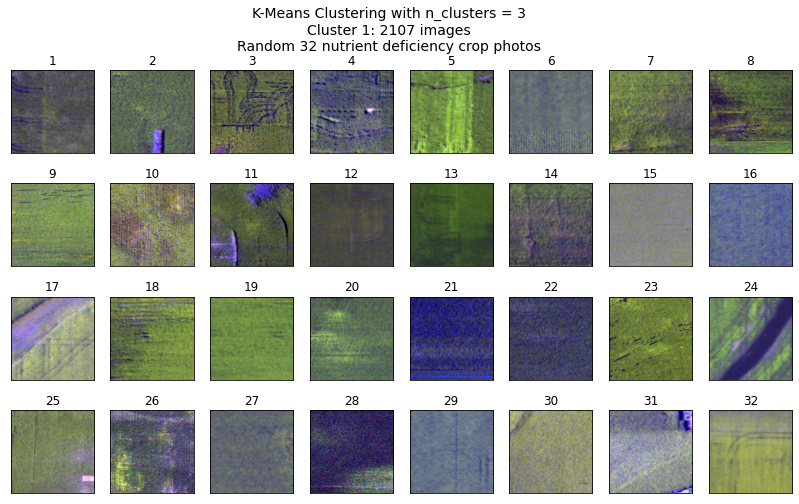

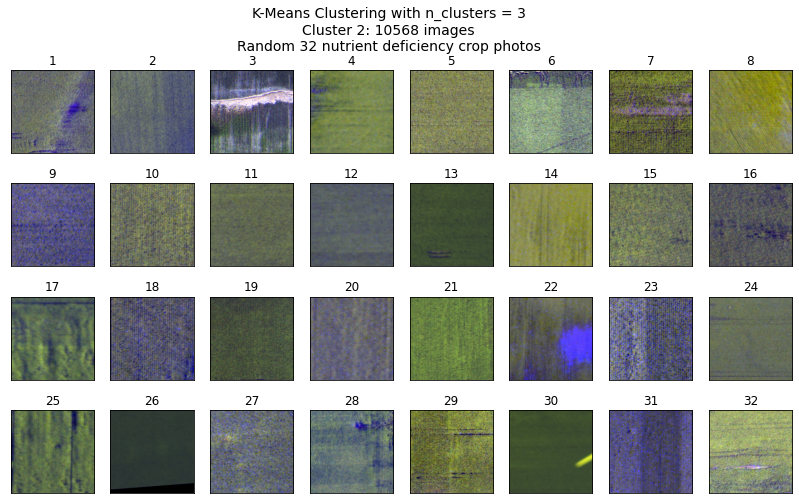

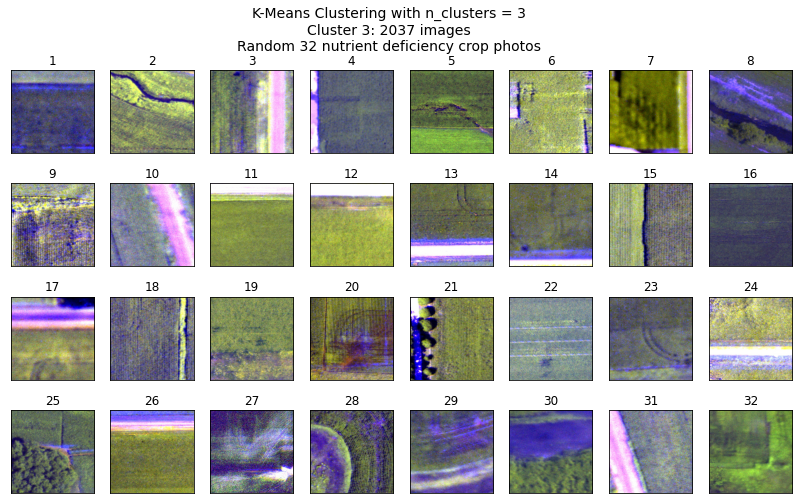

In [41]:
for i in range(3):
    plot_random_24(i,3,groups)

--- 

I'll repeat the above few steps starting with K-Means clustering for a few different `n_clusters` parameters. I'm hoping to see more similarity in each cluster.

In [42]:
def try_clustering(num_clusters):
    #fit the kmeans
    clustering = KMeans(n_clusters=num_clusters,random_state=42)
    clustering.fit(x)
    
    # holds the cluster id and the images { id: [images] }
    clusters = {}
    for image, cluster in zip(images,clustering.labels_):
        if cluster not in clusters.keys():
            clusters[cluster] = []
            clusters[cluster].append(image)
        else:
            clusters[cluster].append(image)
    #print cluster representation:
    print({f'Cluster {i+1}':len(j) for i,j in clusters.items()})
    #plot stuff:
    for i in range(num_clusters):
        plot_random_24(i,num_clusters,clusters)
    return clustering

In [43]:
#use the silhouette score from sci-kit learn to see where our num_clusters k might be best:
from sklearn.metrics import silhouette_score

scores = []

for k in range(2,12):
    c1 = KMeans(n_clusters=k)
    c1.fit(x)
    scores.append((k,silhouette_score(x,c1.labels_)))

scores_df = pd.DataFrame(scores,columns=['$k$','s.score'])
scores_df

,$k$,s.score
0,2,0.174018
1,3,0.023372
2,4,-0.045856
3,5,-0.023108
4,6,-0.047234
5,7,-0.040236
6,8,-0.041729
7,9,-0.043397
8,10,-0.044324
9,11,-0.045785


{'Cluster 1': 2195, 'Cluster 2': 12517}


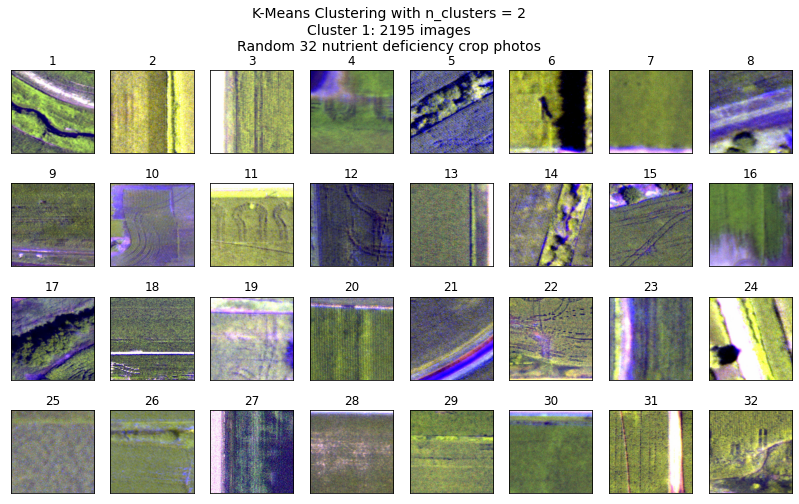

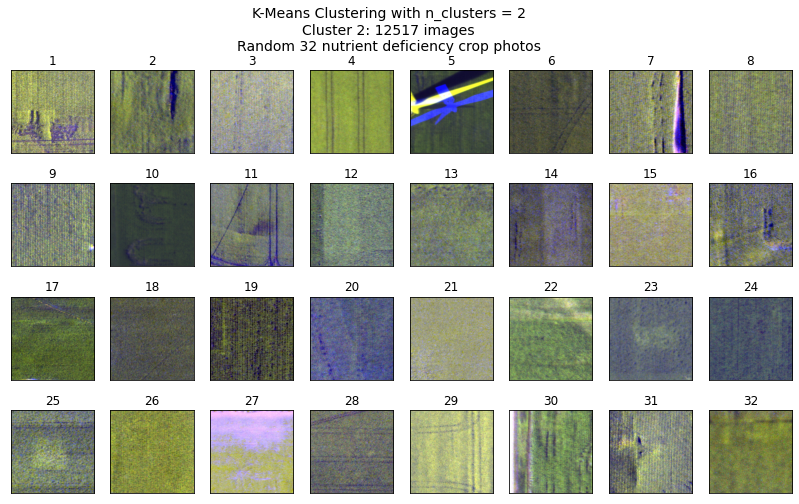

In [58]:
#since k = 2 had the highest silhouette score, we'll go with a means clustering of k=2.
best_clusters = try_clustering(2)

In [50]:
len(images),len(best_clusters.labels_)

(14712, 14712)

In [54]:
df['cluster'] = best_clusters.labels_ + 1

In [56]:
df['cluster'].value_counts(normalize=True)

2    0.850802
1    0.149198
Name: cluster, dtype: float64

85% of the images in the dataset belong to cluster 2, whereas nearly only 15% of the images belong to cluster 1. In UNET, we'll see if the model is better with classifying images from either of the two clusters. 

**Save the clustering to the image metadata file:**

In [59]:
df.to_csv('../data/image_metadata_with_clusters.csv',index=False)

---

Just for fun, see what clusters might look like with `n_clusters=9`:

{'Cluster 5': 1385, 'Cluster 3': 1952, 'Cluster 9': 1644, 'Cluster 7': 2343, 'Cluster 1': 3670, 'Cluster 8': 1450, 'Cluster 2': 1610, 'Cluster 4': 297, 'Cluster 6': 361}


KMeans(n_clusters=9, random_state=42)

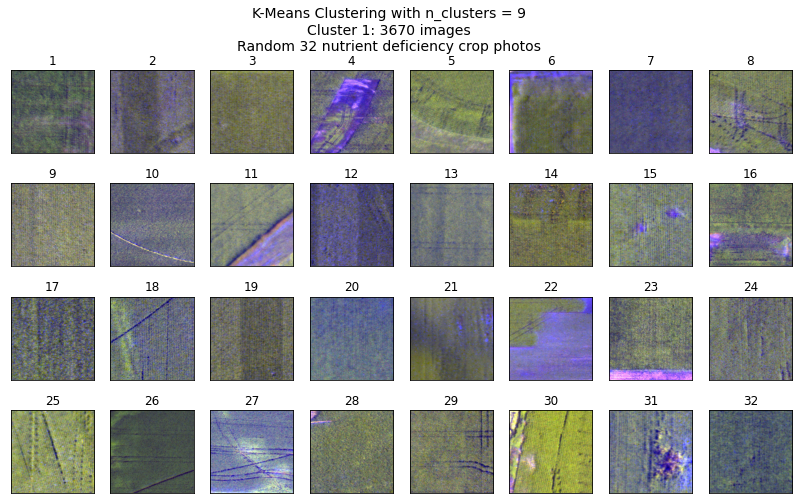

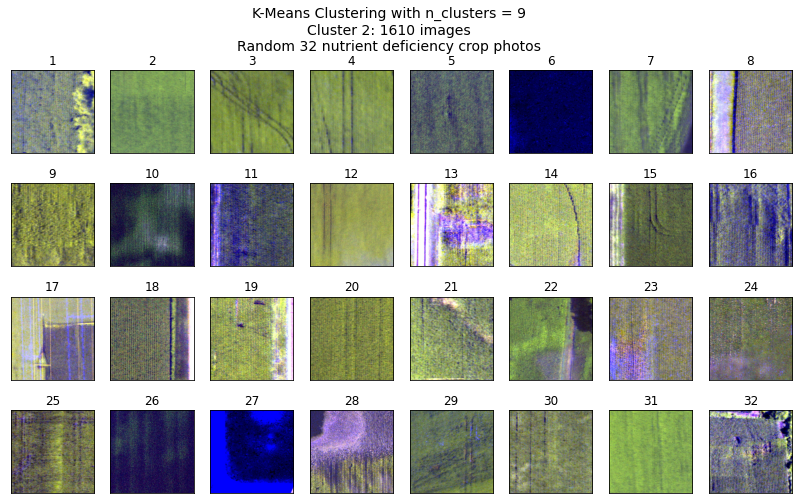

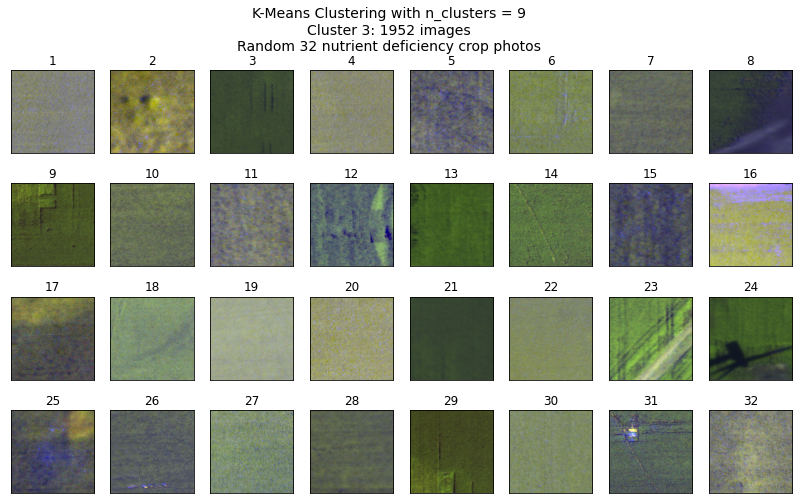

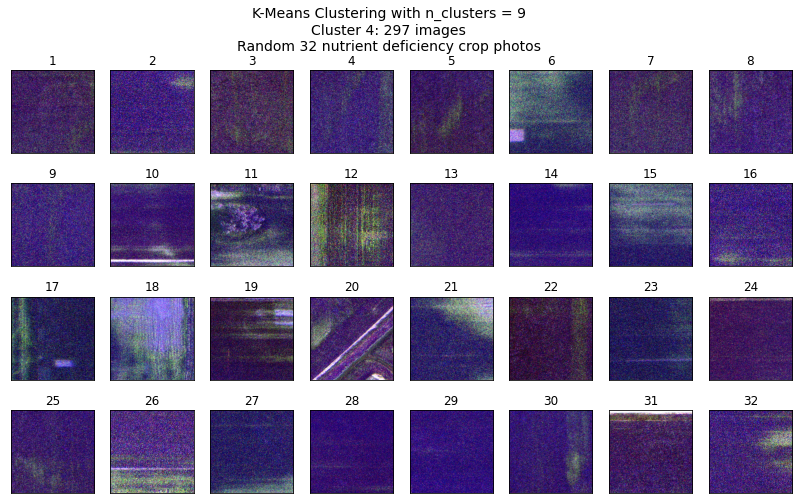

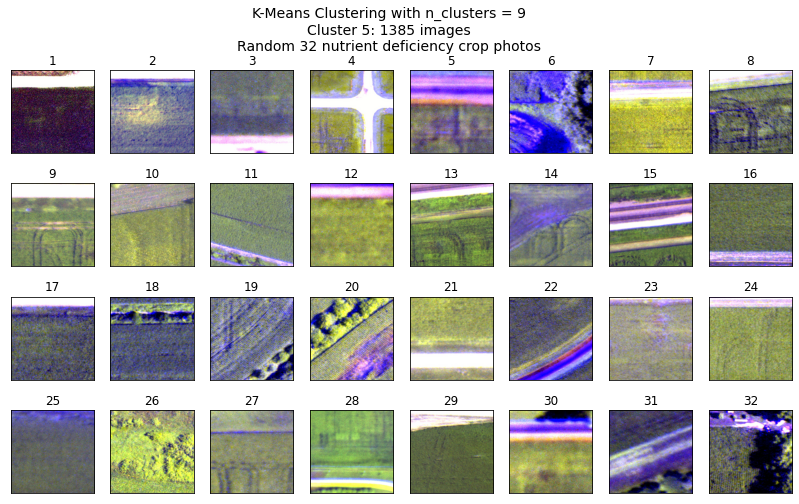

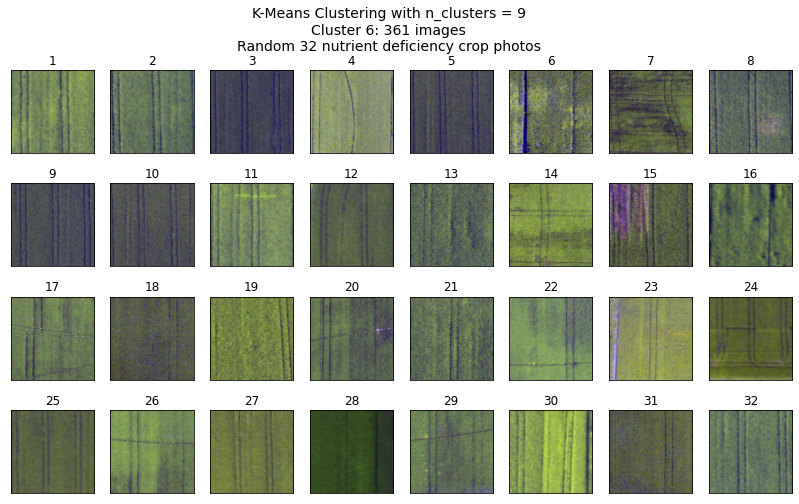

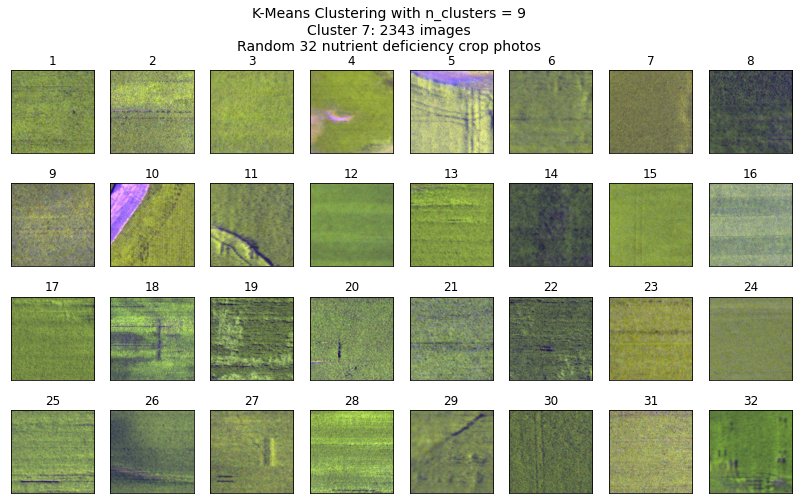

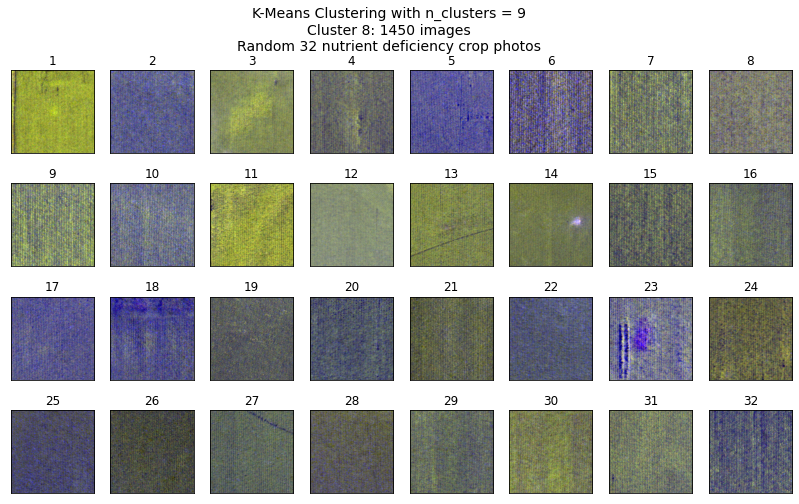

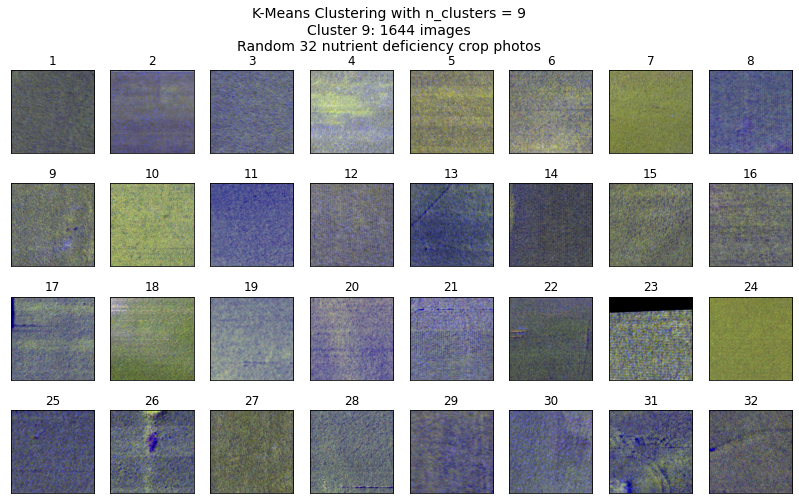

In [44]:
try_clustering(9)